In [1]:
#import data manipulation packages 
import pandas as pd 
import numpy as np 
import os
import cv2
import matplotlib.pyplot as plt
import warnings

In [2]:
#import deep learning tools 
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image, image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow import keras
import tensorflow

In [3]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.16.2
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [5]:
tensorflow.test.is_gpu_available()

2025-03-07 17:10:08.987095: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-03-07 17:10:08.987122: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


True

In [6]:
# Set the seed value for experiment reproducibility.
seed = 1842
tensorflow.random.set_seed(seed)
np.random.seed(seed)
# Turn off warnings for cleaner looking notebook
warnings.simplefilter('ignore')

## Load in the Data

In [7]:
#define image dataset 
#why do we rescale?
image_generator = ImageDataGenerator(rescale=1/255, validation_split=0.2) #shear_range =.25, zoom_range =.2, horizontal_flip = True, rotation_range=20)     

#Train & Validation Split 
train_dataset = image_generator.flow_from_directory(batch_size=32,
                                                 directory='data_cleaned/Train',
                                                 shuffle=True,
                                                 target_size=(224, 224), 
                                                 subset="training",
                                                 class_mode='categorical')

validation_dataset = image_generator.flow_from_directory(batch_size=32,
                                                 directory='data_cleaned/Train',
                                                 shuffle=True,
                                                 target_size=(224, 224), 
                                                 subset="validation",
                                                 class_mode='categorical')

#Organize data for our predictions 
image_generator_submission = ImageDataGenerator(rescale=1/255) 
submission = image_generator_submission.flow_from_directory(
                                                 directory='data_cleaned/scraped_images',
                                                 shuffle=False,
                                                 target_size=(224, 224), 
                                                 class_mode=None)

Found 430 images belonging to 2 classes.
Found 106 images belonging to 2 classes.
Found 100 images belonging to 1 classes.


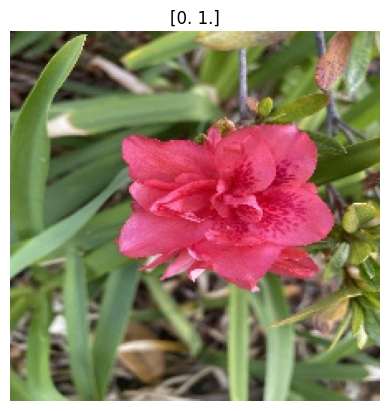

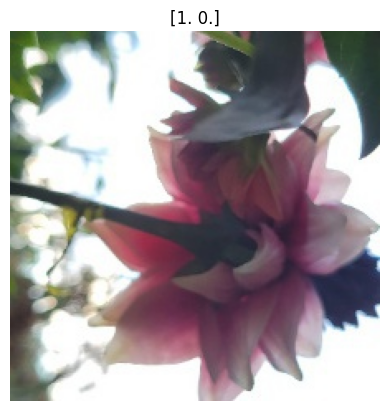

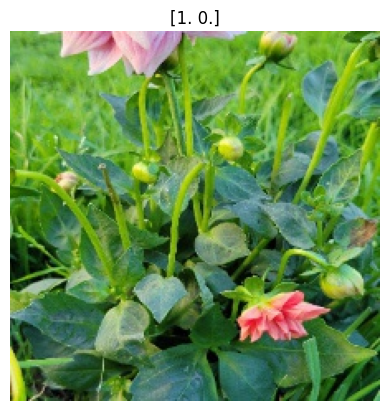

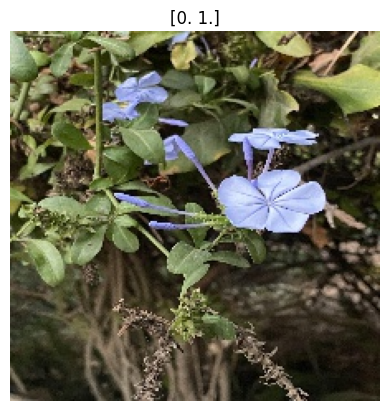

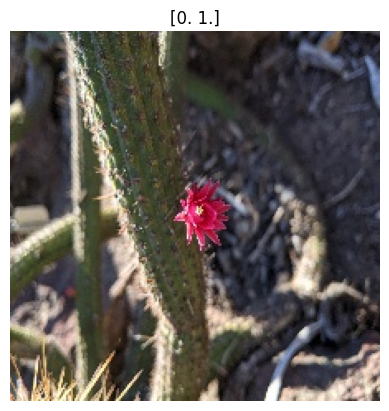

...

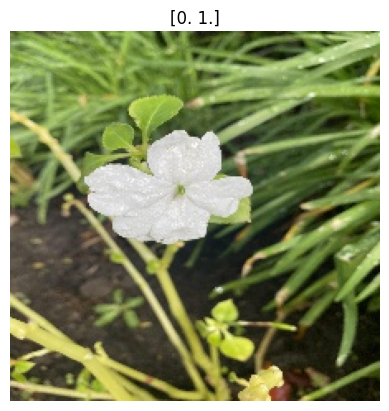

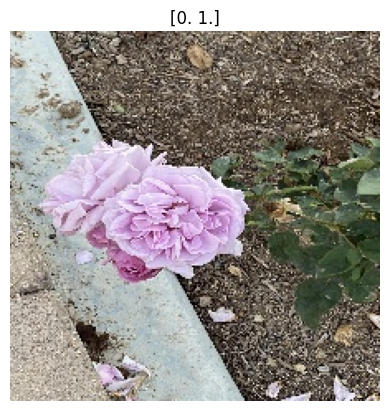

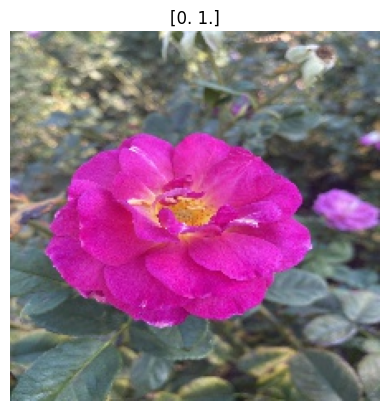

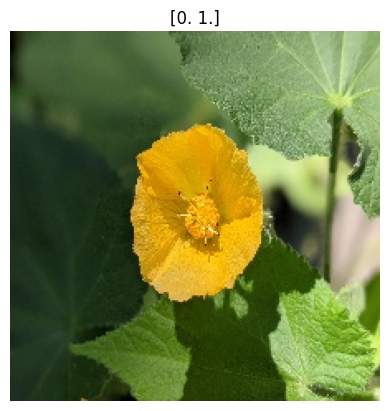

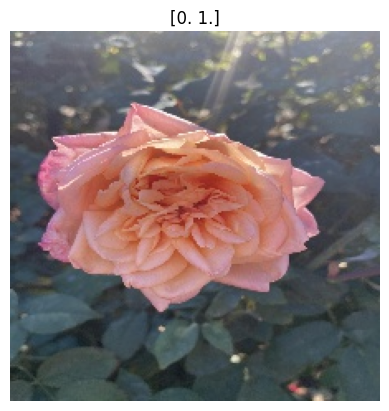

In [8]:
#show flowers for the first batch
batch_1_img = train_dataset[0]
for i in range(0,32):
    img = batch_1_img[0][i]
    lab = batch_1_img[1][i]
    plt.imshow(img)
    plt.title(lab)
    plt.axis('off')
    plt.show()

## Build our First Classifier (CNN)

In [36]:
model = keras.models.Sequential([
    keras.layers.Conv2D(64, 3, activation = 'relu', input_shape = (224, 224, 3)),
    keras.layers.MaxPooling2D(2, 2),    
    keras.layers.Conv2D(32, 3, activation = 'relu', input_shape = (224, 224, 3)),
    keras.layers.MaxPooling2D(2, 2), 
    keras.layers.Dropout(0.5),
    keras.layers.Flatten(),
    keras.layers.Dense(64, activation = 'relu'),
    keras.layers.Dense(2, activation = 'softmax')
])

model.compile(optimizer = 'adam',
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])  

callback = keras.callbacks.EarlyStopping(monitor='val_loss', 
                                         patience=3,
                                         restore_best_weights=True)

              

In [37]:
model.fit(train_dataset, epochs = 20, validation_data = validation_dataset, callbacks = [callback])

Epoch 1/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 182ms/step - accuracy: 0.5178 - loss: 13.6936 - val_accuracy: 0.2925 - val_loss: 7.7899
Epoch 2/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - accuracy: 0.3108 - loss: 8.7926 - val_accuracy: 0.7075 - val_loss: 6.2385
Epoch 3/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - accuracy: 0.7233 - loss: 5.6632 - val_accuracy: 0.6887 - val_loss: 0.6010
Epoch 4/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.4788 - loss: 0.8191 - val_accuracy: 0.7075 - val_loss: 0.5431
Epoch 5/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.6892 - loss: 0.6750 - val_accuracy: 0.7830 - val_loss: 0.4328
Epoch 6/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - accuracy: 0.7422 - loss: 0.5471 - val_accuracy: 0.8396 - val_loss: 0.3998
Epoch 7/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.7419 - loss: 0.5515 - val_accuracy: 0.8774 - val_loss: 0.3961
Epoch 8/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - accuracy: 0.7947 - loss: 0.5305 - val_accuracy: 0.7830 -

In [38]:
loss, accuracy = model.evaluate(validation_dataset)
print("Loss:", loss)
print("Accuracy:", accuracy)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8313 - loss: 0.3925
Loss: 0.37289273738861084
Accuracy: 0.849056601524353


In [27]:
model.predict(submission, model)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


array([[3.9632935e-03, 9.9603671e-01],
       [1.1225962e-05, 9.9998879e-01],
       [1.8648576e-03, 9.9813509e-01],
       [6.6604084e-06, 9.9999332e-01],
       [5.9074478e-04, 9.9940932e-01],
       [2.9318467e-01, 7.0681530e-01],
       [4.5185648e-03, 9.9548137e-01],
       [5.6433569e-06, 9.9999440e-01],
       [1.2791350e-04, 9.9987209e-01],
       [1.8284315e-02, 9.8171562e-01],
       [1.4155100e-02, 9.8584485e-01],
       [3.0881434e-04, 9.9969125e-01],
       [8.9607775e-02, 9.1039222e-01],
       [9.2701623e-05, 9.9990726e-01],
       [2.2620597e-01, 7.7379400e-01],
       [4.6846190e-01, 5.3153813e-01],
       [8.9150842e-04, 9.9910849e-01],
       [5.2773945e-02, 9.4722599e-01],
       [4.3791875e-05, 9.9995625e-01],
       [9.9999738e-01, 2.5883810e-06],
       [1.1270540e-02, 9.8872942e-01],
       [8.0782767e-05, 9.9991918e-01],
       [2.1862458e-03, 9.9781370e-01],
       [4.1957886e-05, 9.9995804e-01],
       [5.8893958e-04, 9.9941111e-01],
       [1.8624387e-03, 9.

## Augment our Data

In [49]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal", input_shape=(224, 224, 3)),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
    tf.keras.layers.RandomContrast(0.1),
])


In [51]:
model_a = keras.Sequential([data_augmentation, model])

model_a.compile(optimizer = 'adam',
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])  

In [52]:
model_a.fit(train_dataset, epochs = 20, validation_data = validation_dataset, callbacks = [callback])

Epoch 1/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - accuracy: 0.7614 - loss: 0.5271 - val_accuracy: 0.8868 - val_loss: 0.3540
Epoch 2/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - accuracy: 0.8417 - loss: 0.4381 - val_accuracy: 0.8585 - val_loss: 0.3728
Epoch 3/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - accuracy: 0.8512 - loss: 0.4026 - val_accuracy: 0.8302 - val_loss: 0.4210
Epoch 4/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8438 - loss: 0.3715 - val_accuracy: 0.7358 - val_loss: 0.6053


In [53]:
loss, accuracy = model_a.evaluate(validation_dataset)
print("Loss:", loss)
print("Accuracy:", accuracy)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.8881 - loss: 0.3411
Loss: 0.35397741198539734
Accuracy: 0.8867924809455872


## Finding Best Model Architecture (Keras Tuner)

In [54]:
pip install -U keras-tuner

Note: you may need to restart the kernel to use updated packages.


In [66]:
train_images = []
train_labels = []

for i in range(len(train_dataset)):
    batch = train_dataset[i]
    for j in range(len(batch[0])):
        train_images.append(batch[0][j])
        train_labels.append(batch[1][j])

validation_images = []
validation_labels = []

for i in range(len(validation_dataset)):
    batch = validation_dataset[i]
    for j in range(len(batch[0])):
        validation_images.append(batch[0][j])
        validation_labels.append(batch[1][j])

train_images = np.array(train_images)
train_labels = np.array(train_labels)
validation_images = np.array(validation_images)
validation_labels = np.array(validation_labels)


In [68]:
from kerastuner.tuners import RandomSearch

def build_model(hp):
    model = keras.models.Sequential()

    model.add(keras.layers.AveragePooling2D(6, 3, input_shape=(224, 224, 3)))

    for i in range(hp.Int("Conv Layers", min_value = 0, max_value = 3)):
        model.add(keras.layers.Conv2D(hp.Choice(f"layer_{i}_filters", [16, 32, 64]), 3, activation = 'relu'))
    
    model.add(keras.layers.MaxPooling2D(2, 2))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Flatten())

    model.add(keras.layers.Dense(hp.Int("Dense Layer", min_value = 32, max_value = 128, step = 32), activation = 'relu'))

    model.add(keras.layers.Dense(2, activation = 'softmax'))

    model.compile(optimizer = 'adam',
                loss = 'binary_crossentropy',
                metrics = ['accuracy'])

    return model

tuner = RandomSearch(
    build_model,
    objective = 'val_loss',
    max_trials = 32,
    )

tuner.search(train_images, train_labels, validation_data=(validation_images, validation_labels), epochs = 20, batch_size = 32)

Trial 32 Complete [00h 00m 09s]
val_loss: 0.45719268918037415

Best val_loss So Far: 0.05434263125061989
Total elapsed time: 00h 18m 07s


In [69]:
best_model = tuner.get_best_models()[0]

In [70]:
best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ average_pooling2d               │ (None, 73, 73, 3)      │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 71, 71, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 69, 69, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 34, 34, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 34, 34, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,735,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,745,506 (18.10 MB)

 Trainable params: 4,745,506 (18.10 MB)

 Non-trainable params: 0 (0.00 B)

### Create Submission File

In [89]:
directory = "data_cleaned/scraped_images/image_files"
onlyfiles = [os.path.splitext(f)[0] for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
submission_df = pd.DataFrame(onlyfiles, columns = ['images'])
submission_df[['la_eterna', 'other_flower']] = model.predict(submission)
submission_df.tail()

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


,images,la_eterna,other_flower
95,img_34,0.264880,0.735120
96,img_20,0.329905,0.670095
97,img_21,0.121644,0.878356
98,img_35,0.076238,0.923762
99,img_09,0.088313,0.911687


In [90]:
submission_df.to_csv('submission.csv', index = False)